In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "5"
os.environ['HTTP_PROXY']="http://fwdproxy:8080"
os.environ['HTTPS_PROXY']="http://fwdproxy:8080"
device = "cuda"

In [2]:
import argparse
from functools import partial
import cv2
import requests

from io import BytesIO
from PIL import Image
import numpy as np
from pathlib import Path
import random


import warnings
warnings.filterwarnings("ignore")


import torch
from torchvision.ops import box_convert
import torchvision.transforms.functional as F
import torchvision.transforms.functional as TF
import torchvision.transforms as transforms

from groundingdino.models import build_model
from groundingdino.util.slconfig import SLConfig
from groundingdino.util.utils import clean_state_dict
from groundingdino.util.inference import annotate, predict
import groundingdino.datasets.transforms as T
import supervision as sv

from omegaconf import OmegaConf
from ldm.models.diffusion.ddim import DDIMSampler
from ldm.models.diffusion.plms import PLMSSampler
from transformers import CLIPProcessor, CLIPModel
from copy import deepcopy
from ldm.util import instantiate_from_config
from trainer import read_official_ckpt, batch_to_device
from inpaint_mask_func import draw_masks_from_boxes, read_masks_from_figure
import numpy as np
import clip
from scipy.io import loadmat
from functools import partial

from huggingface_hub import hf_hub_download
from utils import load_image, grounding_transform, gligen_transform, load_ckpt
# to be move to utils later
from gligen_inverse_edit import prepare_batch

# Load DINO Models for Box Detection and Drawing

In [3]:
def load_model_hf(repo_id, filename, ckpt_config_filename, device='cpu'):
    cache_config_file = hf_hub_download(repo_id=repo_id, filename=ckpt_config_filename)

    args = SLConfig.fromfile(cache_config_file) 
    model = build_model(args)
    args.device = device

    cache_file = hf_hub_download(repo_id=repo_id, filename=filename)
    checkpoint = torch.load(cache_file, map_location='cpu')
    log = model.load_state_dict(clean_state_dict(checkpoint['model']), strict=False)
    print("Model loaded from {} \n => {}".format(cache_file, log))
    _ = model.eval()
    return model

In [4]:
ckpt_repo_id = "ShilongLiu/GroundingDINO"
ckpt_filenmae = "groundingdino_swint_ogc.pth"
ckpt_config_filename = "GroundingDINO_SwinT_OGC.cfg.py"
model = load_model_hf(ckpt_repo_id, ckpt_filenmae, ckpt_config_filename)

final text_encoder_type: bert-base-uncased
Model loaded from /home/tanghaoyue13/.cache/huggingface/hub/models--ShilongLiu--GroundingDINO/snapshots/a94c9b567a2a374598f05c584e96798a170c56fb/groundingdino_swint_ogc.pth 
 => _IncompatibleKeys(missing_keys=[], unexpected_keys=['label_enc.weight'])


In [5]:
input_image_path = "inference_images/beach.jpg"
input_source = load_image(input_image_path)

In [6]:
import supervision as sv


TEXT_PROMPT = "flower"
BOX_TRESHOLD = 0.35
TEXT_TRESHOLD = 0.25

image_dino = grounding_transform(input_source)
boxes, logits, phrases = predict(
    model=model, 
    image=image_dino, 
    caption=TEXT_PROMPT, 
    box_threshold=BOX_TRESHOLD, 
    text_threshold=TEXT_TRESHOLD
)

input_image_np = np.asarray(input_source)
annotated_frame = annotate(image_source=input_image_np, boxes=boxes, logits=logits, phrases=phrases)
annotated_frame = annotated_frame[...,::-1] 

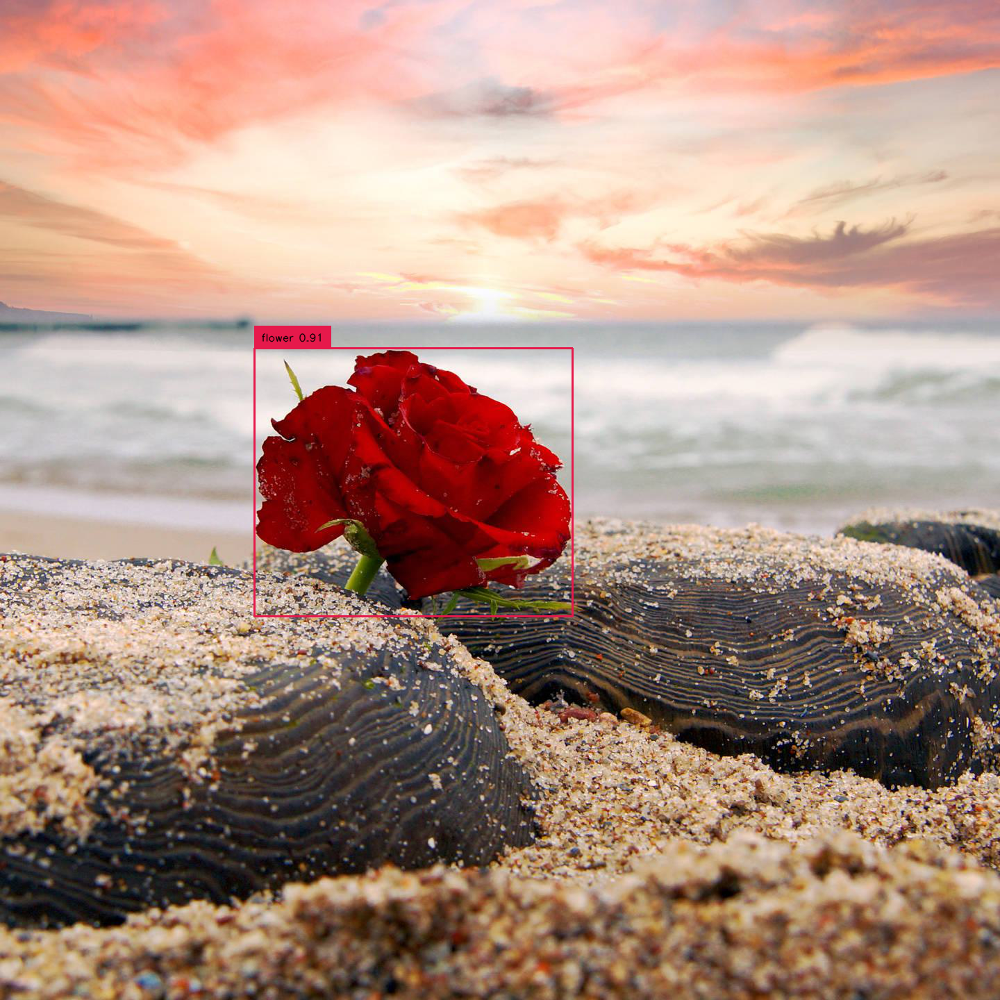

In [7]:
Image.fromarray(annotated_frame)

In [8]:
def generate_masks_with_grounding(image_source, boxes):
    h, w, _ = image_source.shape
    boxes_unnorm = boxes * torch.Tensor([w, h, w, h])
    boxes_xyxy = box_convert(boxes=boxes_unnorm, in_fmt="cxcywh", out_fmt="xyxy").numpy()
    mask = np.zeros_like(image_source)
    for box in boxes_xyxy:
        x0, y0, x1, y1 = box
        mask[int(y0):int(y1), int(x0):int(x1), :] = 255
    return mask

In [9]:
image_mask = generate_masks_with_grounding(grounding_transform(input_source), boxes)
image_mask = image_mask[...,::-1] 
Image.fromarray(image_mask)

TypeError: Cannot handle this data type: (1, 1, 800), <f4

# Position Aware Inpainting and Edit

In [11]:
xyxy_boxes = box_convert(boxes=boxes, in_fmt="cxcywh", out_fmt="xyxy").tolist()
xyxy_boxes[:2]

[[0.25420141220092773,
  0.34805285930633545,
  0.5728242993354797,
  0.616330087184906]]

In [12]:
# edit configurations
meta = dict(
            ckpt = "gligen_checkpoints/diffusion_pytorch_model.bin",
            ori_prompt = "a flower on the beach",
            edit_prompt = "a cat on the beach",
            ori_phrases = ['flower'],
            edit_phrases = ['cat'],
            locations = [[0.25, 0.34, 0.57, 0.61]],
            alpha_type = [0.3, 0.0, 0.7],
            save_folder_name="edit_inverse", 
        )

In [13]:
model, autoencoder, text_encoder, diffusion, config = load_ckpt(meta["ckpt"], device)
grounding_tokenizer_input = instantiate_from_config(config['grounding_tokenizer_input'])
model.grounding_tokenizer_input = grounding_tokenizer_input
grounding_downsampler_input = None
if "grounding_downsampler_input" in config:
    grounding_downsampler_input = instantiate_from_config(config['grounding_downsampler_input'])
    print(config['grounding_downsampler_input'])
config['batch_size'] = 1
config['folder'] = "generation_samples"
config['guidance_scale'] = 7.5
config = OmegaConf.create(config)

making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 4, 32, 32) = 4096 dimensions.
making attention of type 'vanilla' with 512 in_channels


In [14]:
# set DDIM parameters
from gligen_inverse_edit import alpha_generator, set_alpha_scale
alpha_generator_func = partial(alpha_generator, type=[0.3, 0.0, 0.7])
steps = 250
sampler = DDIMSampler(diffusion, model, alpha_generator_func=alpha_generator_func, set_alpha_scale=set_alpha_scale)

In [15]:
# prepare image and text conditions
input_image = gligen_transform(input_source, device)
with torch.no_grad():
    z0 = autoencoder.encode( input_image )
    starting_noise = torch.randn(config.batch_size, 4, 64, 64).to(device)
    ori_batch, target_batch = prepare_batch(meta, batch=1)
    ori_context = text_encoder.encode(  [meta["ori_prompt"]]*config.batch_size  )
    target_context = text_encoder.encode( [meta["edit_prompt"]]*config.batch_size )
    uc = text_encoder.encode( config.batch_size*[""] )

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [16]:
with torch.no_grad():
    ori_grounding_input = grounding_tokenizer_input.prepare(ori_batch)
    target_grounding_input = grounding_tokenizer_input.prepare(target_batch)

In [17]:
# test direct generation and inversion
shape = (config.batch_size, model.in_channels, model.image_size, model.image_size)
ori_input = dict(x = starting_noise, timesteps=None, context = ori_context, grounding_input = ori_grounding_input,
                inpainting_extra_input = None, grounding_extra_input = None)
target_input = dict(x = starting_noise, timesteps=None, context = target_context, grounding_input = target_grounding_input,
                   inpainting_extra_input = None, grounding_extra_input = None)
with torch.no_grad():
    ori_samples_fake_z = sampler.sample(S=steps, shape=shape, input=ori_input, uc=uc, guidance_scale=config.guidance_scale, mask=None, x0=None)
    target_samples_fake_z = sampler.sample(S=steps, shape=shape, input=target_input, uc=uc, guidance_scale=config.guidance_scale, mask=None, x0=None)

DDIM Sampler: 100%|███████████████████████████| 250/250 [00:54<00:00,  4.59it/s]


In [20]:
def image2nparray(image_tensor):
    image_tensor = torch.clamp(image_tensor, min=-1, max=1) * 0.5 + 0.5
    image_list = []
    for img in image_tensor:
        img = img.cpu().detach().numpy().transpose(1,2,0) * 255
        image_list.append(img.astype(np.uint8))
    return image_list

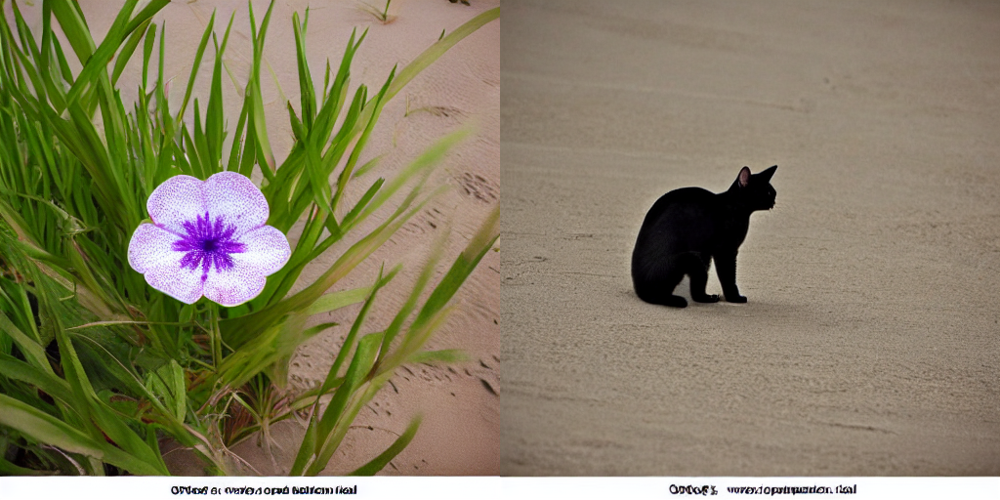

In [21]:
ori_img_list = autoencoder.decode(ori_samples_fake_z)
target_img_list = autoencoder.decode(target_samples_fake_z)
img_ids = list(range(0, config.batch_size))
img_list = []
for image_id, ori_img, target_img in zip(img_ids, image2nparray(ori_img_list), image2nparray(target_img_list)):
    img_list.append(ori_img)
    img_list.append(target_img)
Image.fromarray(np.concatenate(img_list, axis=1))

In [22]:
# prepare for inverse:
inverse_alpha_generator_func = partial(alpha_generator, type=[1., 0., 0.])
steps = 250
inverse_sampler = DDIMSampler(diffusion, model, alpha_generator_func=inverse_alpha_generator_func, set_alpha_scale=set_alpha_scale)
ori_input["x"] = ori_samples_fake_z
ori_input["context"] = uc
with torch.no_grad():
    ori_inverse_z = inverse_sampler.inverse(S=steps, shape=shape, input=ori_input, uc=uc, guidance_scale=2., mask=None, x0=None, gamma_start=0.1, gamma_end=1.)

DDIM Inverse Sampler: 100%|███████████████████| 225/225 [00:48<00:00,  4.62it/s]


In [37]:
# test for inverse and reconstruct
ori_input["x"] = ori_samples_fake_z
ori_input["context"] = uc
with torch.no_grad():
    ori_inverse_z = inverse_sampler.inverse(S=steps, shape=shape, input=ori_input, uc=uc, guidance_scale=2., mask=None, x0=None, gamma_start=0.7, gamma_end=1.)
    ori_input["x"] = ori_inverse_z
    uc_recons = sampler.sample(S=steps, shape=shape, input=ori_input, uc=uc, guidance_scale=0., mask=None, x0=None, gamma_start=0.5, gamma_end=1.)
latent_recons = autoencoder.decode(ori_inverse_z)
uc_recons = autoencoder.decode(uc_recons)
latent_list = image2nparray(latent_recons)
uc_list = image2nparray(uc_recons)
img_list = []
for image_id, ori_img, uc_latent, uc_inverse in zip(img_ids, image2nparray(ori_img_list), latent_list, uc_list):
    img_list.append(ori_img)
    img_list.append(uc_latent)
    img_list.append(uc_inverse)
Image.fromarray(np.concatenate(img_list, axis=1)) 

DDIM Sampler: 100%|███████████████████████████| 125/125 [00:27<00:00,  4.58it/s]


TypeError: clamp() received an invalid combination of arguments - got (list, max=int, min=int), but expected one of:
 * (Tensor input, Tensor min, Tensor max, *, Tensor out)
 * (Tensor input, Number min, Number max, *, Tensor out)


In [36]:
latent_recons.shape
latent_list = image2nparray(latent_recons)

DDIM Inverse Sampler: 100%|███████████████████| 225/225 [00:48<00:00,  4.60it/s]


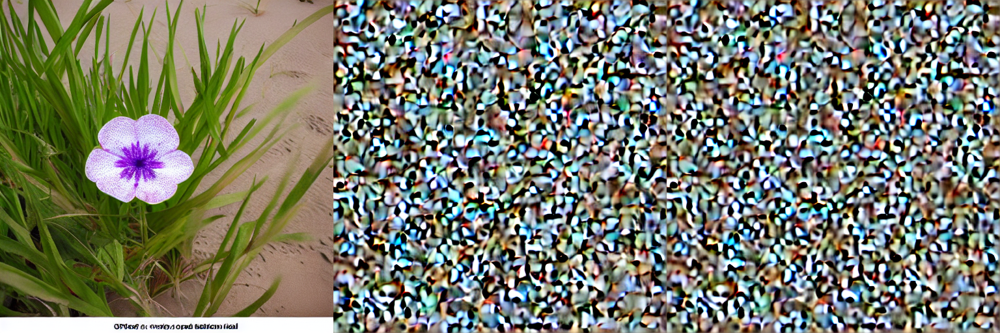

In [25]:
ori_input["context"] = uc
with torch.no_grad():
    ori_inverse_z = inverse_sampler.inverse(S=steps, shape=shape, input=ori_input, uc=uc, guidance_scale=2., mask=None, x0=None, gamma_start=0.1, gamma_end=1.)
    ori_inverse_uc = inverse_sampler.inverse(S=steps, shape=shape, input=ori_input, uc=uc, guidance_scale=0., mask=None, x0=None, gamma_start=0.1, gamma_end=1.)
    # ori_inverse_recons_z = sampler.sample(S=steps, shape=shape, input=ori_input,  uc=uc, guidance_scale=0., mask=None, x0=None, gamma_start=0.0, gamma_end=1.)
uc_latent, uc_inverse = autoencoder.decode(ori_inverse_z), autoencoder.decode(ori_inverse_uc)
uc_latent_list, uc_inverse_list = image2nparray(uc_latent), image2nparray(uc_inverse)
img_list = []
for image_id, ori_img, uc_latent, uc_inverse in zip(img_ids, image2nparray(ori_img_list), uc_latent_list, uc_inverse_list):
    img_list.append(ori_img)
    img_list.append(uc_latent)
    img_list.append(uc_inverse)
Image.fromarray(np.concatenate(img_list, axis=1))

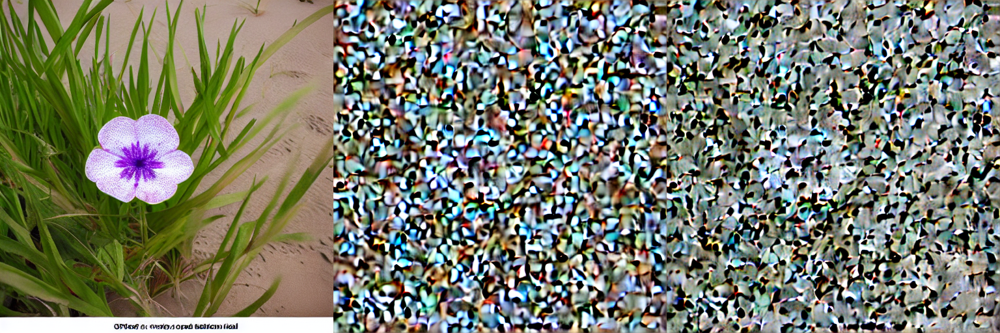

In [24]:
img_list = []
for image_id, ori_img, uc_latent, uc_inverse in zip(img_ids, image2nparray(ori_img_list), uc_latent_list, uc_inverse_list):
    img_list.append(ori_img)
    img_list.append(uc_latent)
    img_list.append(uc_inverse)
Image.fromarray(np.concatenate(img_list, axis=1))

In [ ]:
with torch.no_grad():
    

In [28]:
# DDIM inversion
ori_input["x"], target_input["x"] = ori_inverse_z, ori_inverse_z
ori_input["context"], target_input["context"] = ori_context, target_context 
with torch.no_grad():
    ori_inverse_recons_z = sampler.sample(S=steps, shape=shape, input=ori_input,  uc=uc, guidance_scale=config.guidance_scale, mask=None, x0=None, gamma_start=0., gamma_end=1.)
    target_inverse = sampler.sample(S=steps, shape=shape, input=target_input,  uc=uc, guidance_scale=config.guidance_scale, mask=None, x0=None, gamma_start=0., gamma_end=1.)
    latent_samples = autoencoder.decode(ori_inverse_z)
    ori_samples_DDIMinverse = autoencoder.decode(ori_inverse_recons_z)
    target_samples_DDIMinverse = autoencoder.decode(target_inverse)

DDIM Sampler: 100%|███████████████████████████| 250/250 [00:54<00:00,  4.58it/s]


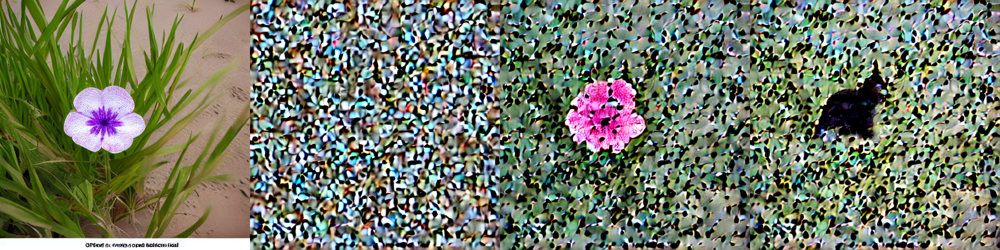

In [29]:
img_ids = list(range(0, config.batch_size))
torch.cuda.empty_cache()

ori_img_list = autoencoder.decode(ori_samples_fake_z)
ori_img_list = image2nparray(ori_img_list)
ori_inverse_latent_list = image2nparray(latent_samples)
ori_recons_list = image2nparray(ori_samples_DDIMinverse)
target_inverse_list = image2nparray(target_samples_DDIMinverse)

img_list = []
for image_id, ori_img, ori_latent, ori_recons, target_img in zip(img_ids, ori_img_list, ori_inverse_latent_list, ori_recons_list, target_inverse_list):
    img_list.append(ori_img)
    img_list.append(ori_latent)
    img_list.append(ori_recons)
    img_list.append(target_img)
Image.fromarray(np.concatenate(img_list, axis=1))

In [21]:
img_list

In [26]:
image_inpainting = (image_inpainting * 255).astype(np.uint8)

In [27]:
image_inpainting = np.concatenate(image_inpainting, axis=1)

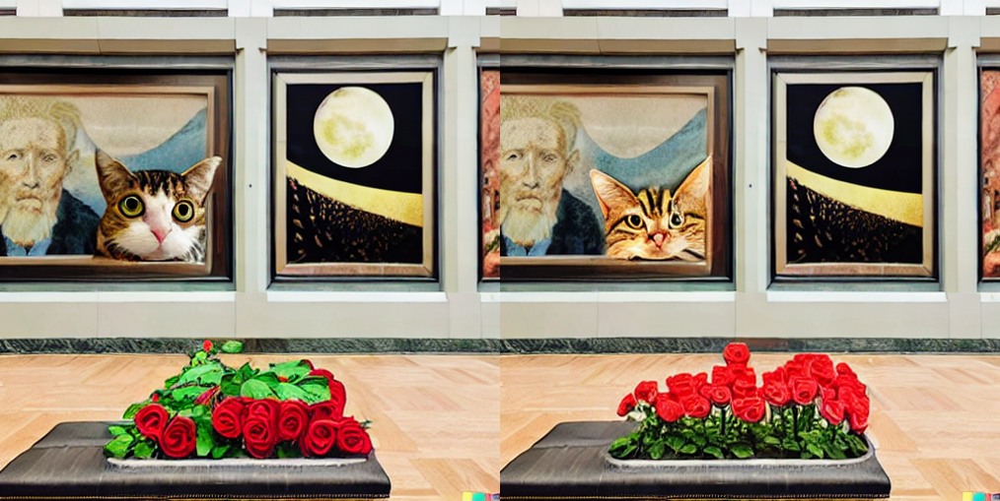

In [28]:
Image.fromarray(image_inpainting).resize((image_source.size[0]*2, image_source.size[1]))